### Libraries

In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import time

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, roc_curve, auc
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier

## Import Data

Context
Reduction of child mortality is reflected in several of the United Nations' Sustainable Development Goals and is a key indicator of human progress.
The UN expects that by 2030, countries end preventable deaths of newborns and children under 5 years of age, with all countries aiming to reduce under‑5 mortality to at least as low as 25 per 1,000 live births.

Parallel to notion of child mortality is of course maternal mortality, which accounts for 295 000 deaths during and following pregnancy and childbirth (as of 2017). The vast majority of these deaths (94%) occurred in low-resource settings, and most could have been prevented.

In light of what was mentioned above, Cardiotocograms (CTGs) are a simple and cost accessible option to assess fetal health, allowing healthcare professionals to take action in order to prevent child and maternal mortality. The equipment itself works by sending ultrasound pulses and reading its response, thus shedding light on fetal heart rate (FHR), fetal movements, uterine contractions and more.

Data
This dataset contains 2126 records of features extracted from Cardiotocogram exams, which were then classified by three expert obstetritians into 3 classes:

* Normal
* Suspect
* Pathological

In [5]:
df = pd.read_csv('fetal_health.csv')
df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


### EDA

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
baseline value                                            2126 non-null float64
accelerations                                             2126 non-null float64
fetal_movement                                            2126 non-null float64
uterine_contractions                                      2126 non-null float64
light_decelerations                                       2126 non-null float64
severe_decelerations                                      2126 non-null float64
prolongued_decelerations                                  2126 non-null float64
abnormal_short_term_variability                           2126 non-null float64
mean_value_of_short_term_variability                      2126 non-null float64
percentage_of_time_with_abnormal_long_term_variability    2126 non-null float64
mean_value_of_long_term_variability                       2126 non-null float64
histogram_wid

* there is no NaN, in the dataset and all the features are in float.

* Below we can find the descriptive statistics for each feature.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,133.303857,9.840844,106.0,126.000,133.000,140.000,160.000
accelerations,2126.0,0.003178,0.003866,0.0,0.000,0.002,0.006,0.019
fetal_movement,2126.0,0.009481,0.046666,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2126.0,0.004366,0.002946,0.0,0.002,0.004,0.007,0.015
light_decelerations,2126.0,0.001889,0.002960,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2126.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2126.0,0.000159,0.000590,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2126.0,46.990122,17.192814,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2126.0,1.332785,0.883241,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2126.0,9.846660,18.396880,0.0,0.000,0.000,11.000,91.000


In [8]:
df.fetal_health.value_counts()

1.0    1655
2.0     295
3.0     176
Name: fetal_health, dtype: int64

* As we can see, we have an imbalance multi-class target.
 * 1.0 means Normal
 * 2.0 means Suspect
 * 3.0 means Pathological

In [16]:
df.isna().sum()

baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

In [24]:
df.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

In [82]:
# Column names are too long in some cases and it might cause problems in visualizations

df.rename(columns={"abnormal_short_term_variability": "astv",
                   "mean_value_of_short_term_variability": "mvostv",
                  "percentage_of_time_with_abnormal_long_term_variability":"potwaltv",
                  "mean_value_of_long_term_variability":"mvoltv"}, inplace=True)

In [48]:
df.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'astv', 'mvostv', 'potwaltv', 'mvoltv',
       'histogram_width', 'histogram_min', 'histogram_max',
       'histogram_number_of_peaks', 'histogram_number_of_zeroes',
       'histogram_mode', 'histogram_mean', 'histogram_median',
       'histogram_variance', 'histogram_tendency', 'fetal_health'],
      dtype='object')

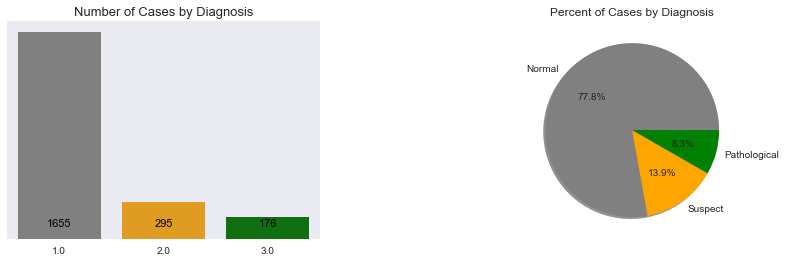

In [152]:
plt.figure(figsize = (14, 4))

ax0 = plt.subplot(1, 2, 1)
ax1 = plt.subplot(1, 2, 2)

proportion = df['fetal_health'].value_counts()/df.shape[0]
Normal = len(df[df['fetal_health'] == 1.0])
Suspect = len(df[df['fetal_health'] == 2.0])
Pathological = len(df[df['fetal_health'] == 3.0])

sns.countplot(x = 'fetal_health', data = df, 
              palette = ['grey', 'orange', 'green'], ax = ax0)
ax0.set_title('Number of Cases by Diagnosis', size = 13)
ax0.set_xlabel(None)
ax0.text(x = 0, y = 100, s = Normal, size = 11, 
         color = 'black', horizontalalignment = 'center')
ax0.text(x = 1, y = 100, s = Suspect, size = 11,
        color = 'black', horizontalalignment = 'center')
ax0.text(x = 2, y = 100, s = Pathological, size = 11,
        color = 'black', horizontalalignment = 'center')
ax0.yaxis.set_visible(False)
sns.despine(left = True)

proportion.plot(kind = 'pie', autopct = '%.1f%%', 
                explode = [0, 0, 0], shadow = True,
                labels = ['Normal', 'Suspect', 'Pathological'], colors = ['grey', 'orange', 'green'], 
                ax = ax1)
ax1.set_title('Percent of Cases by Diagnosis')
ax1.yaxis.set_visible(False)

plt.subplots_adjust(wspace = 0.5)
plt.show()

/Users/Ali/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


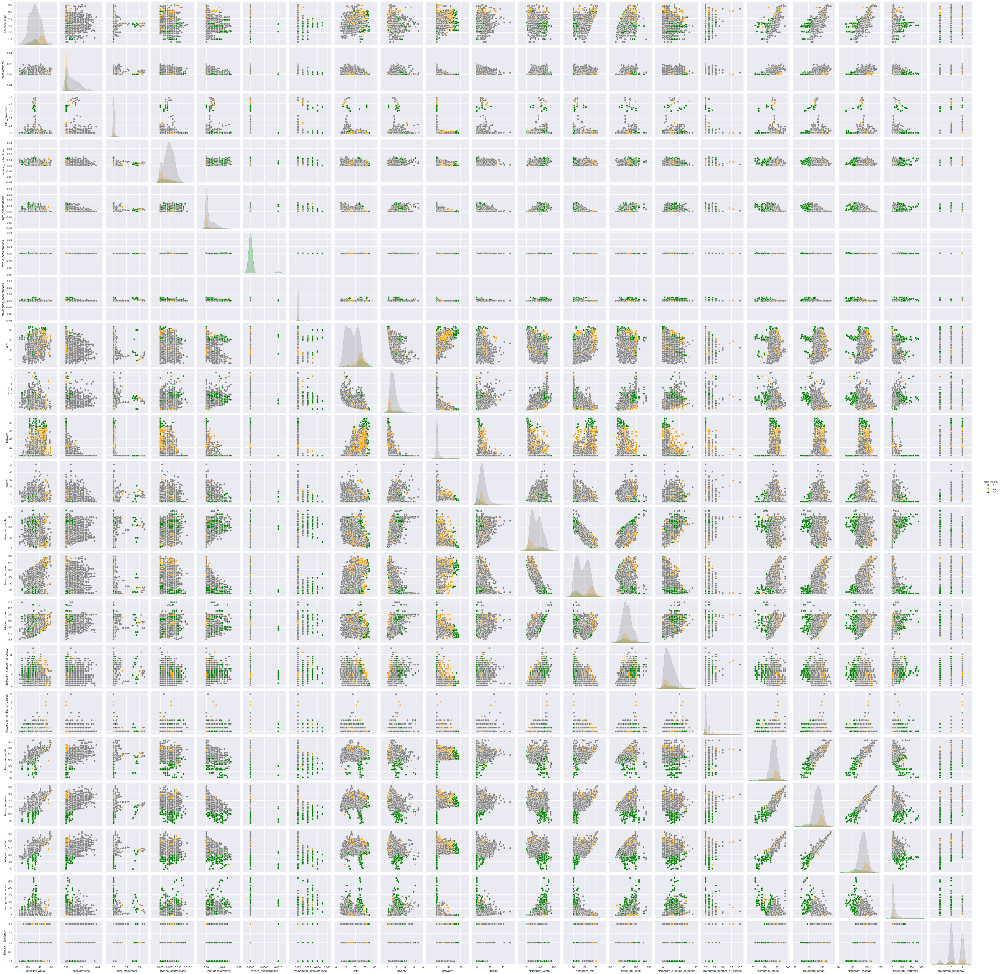

In [56]:
# I used Paiplot to visualize the whole Dataframe to see the realtionship of each pair of features in my dataset
# and too check how separable they are
# Below we can see a plot of (22*22) which means we have pairplot of 484!

sns.pairplot(df, hue = 'fetal_health', 
             palette = ({1.0: 'grey', 2.0: 'orange', 3.0: 'green'}))

/Users/Ali/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


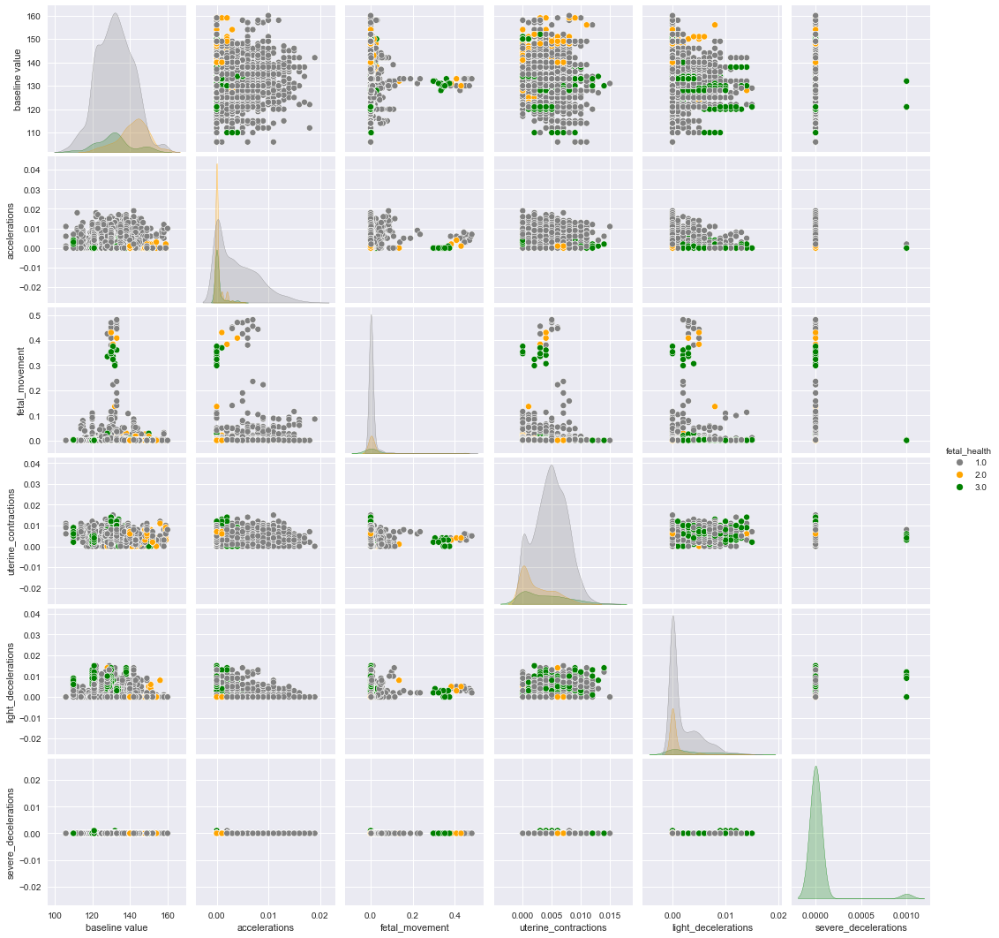

In [39]:
#It is not recommended that we use pairplot in different plotting to have a better view on our data
#because we might lose some combination between our data

sns.pairplot(df[['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations',
                  'severe_decelerations','fetal_health']], hue = 'fetal_health', 
             palette = ({1.0: 'grey', 2.0: 'orange', 3.0: 'green'}))

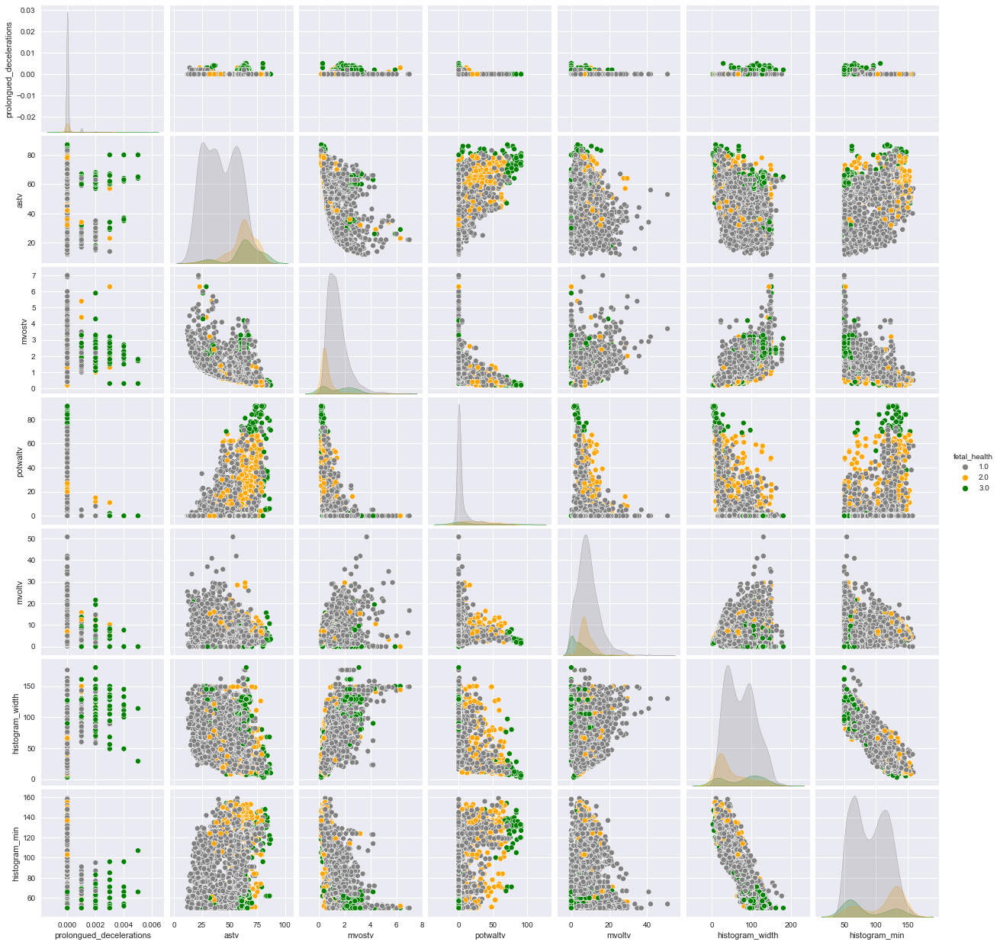

In [49]:
sns.pairplot(df[['prolongued_decelerations', 'astv', 'mvostv', 'potwaltv', 'mvoltv',
       'histogram_width', 'histogram_min','fetal_health']], hue = 'fetal_health', 
             palette = ({1.0: 'grey', 2.0: 'orange', 3.0: 'green'}))

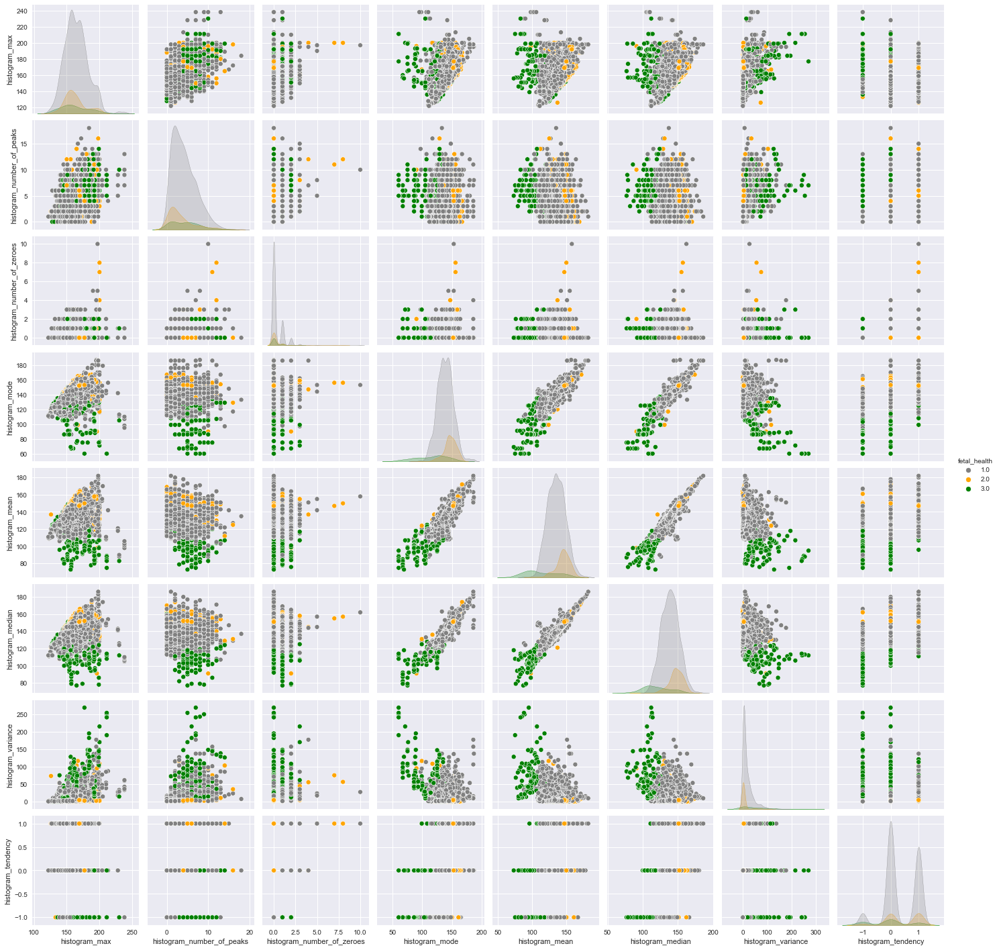

In [50]:
sns.pairplot(df[['histogram_max',
       'histogram_number_of_peaks', 'histogram_number_of_zeroes',
       'histogram_mode', 'histogram_mean', 'histogram_median',
       'histogram_variance', 'histogram_tendency', 'fetal_health']], hue = 'fetal_health', 
             palette = ({1.0: 'grey', 2.0: 'orange', 3.0: 'green'}))

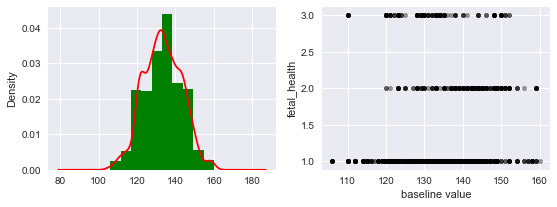

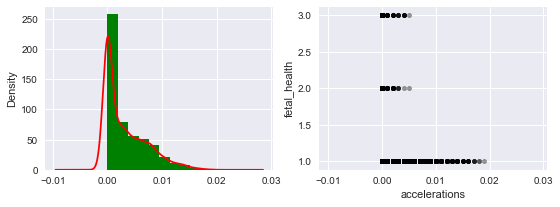

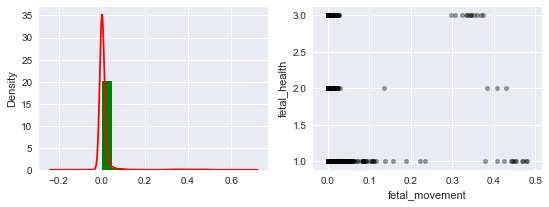

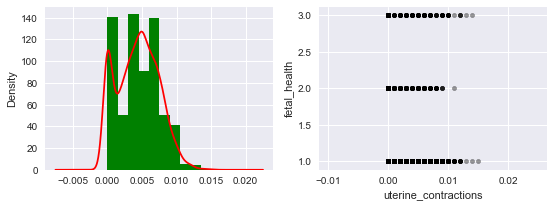

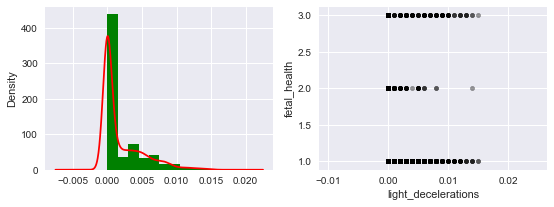

...

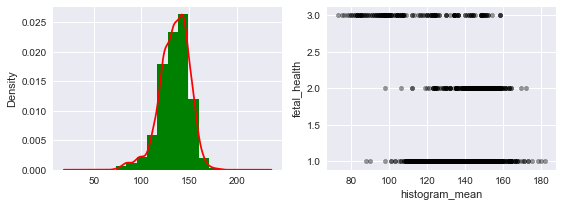

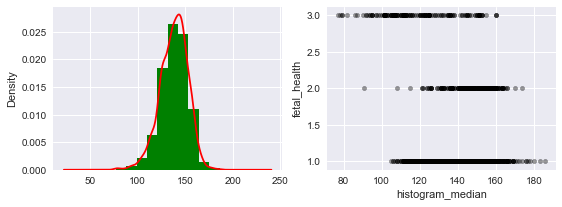

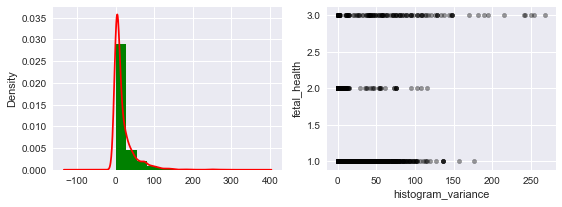

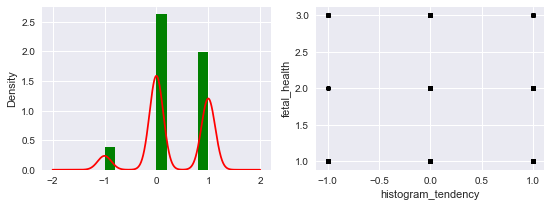

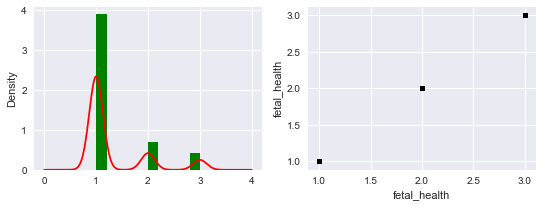

In [42]:
# I used Histogram and Kde for each column to see the distribution of data in one side and on the other side 
# visualize the relationship between each feature and my target variable


for column in df.columns:
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,3))
    df[column].plot.hist(density=True, color='g', label='Histogram',ax=ax1)
    df[column].plot.kde(color='r', label='Kde',ax=ax1)
    
    
    df.plot(kind='scatter', x=column, y='fetal_health',ax=ax2, alpha=0.4, color='black')
    plt.show()

/Users/Ali/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/Users/Ali/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


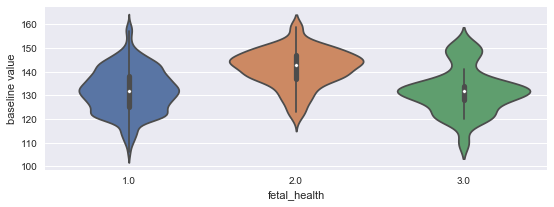

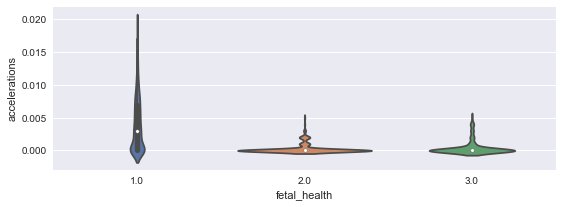

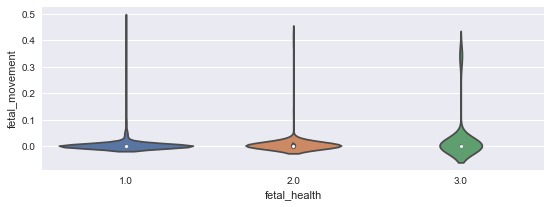

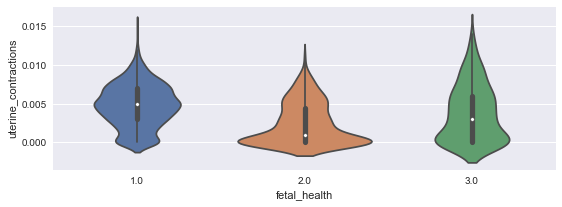

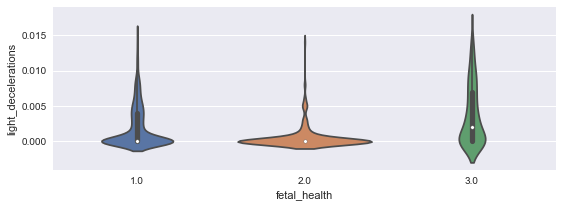

...

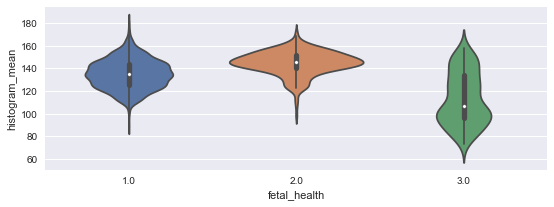

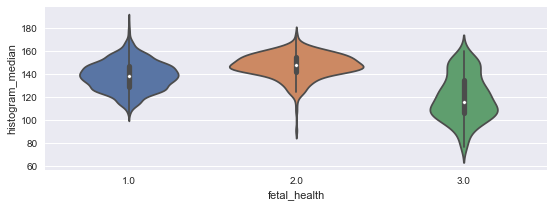

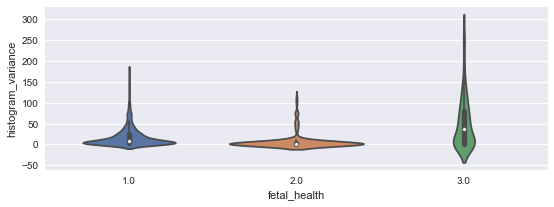

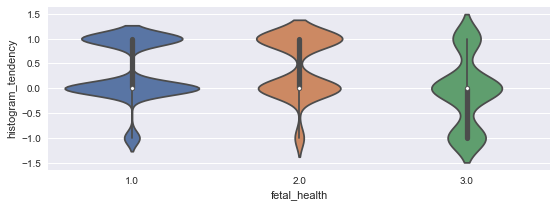

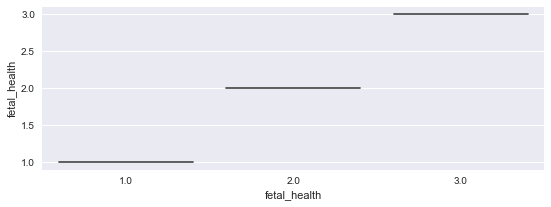

In [86]:
for column in df.columns:    
    fig, ax =plt.subplots(1,1,figsize=(9,3))
    sns.violinplot(data=df, y=column, x='fetal_health', palette="deep");

In [ ]:
fig, ax =plt.subplots(1,2,figsize=(25,5))
sns.kdeplot(fetal_health_df['fetal_movement'],ax=ax[0],hue=fetal_health_df['fetal_health'],multiple="stack");

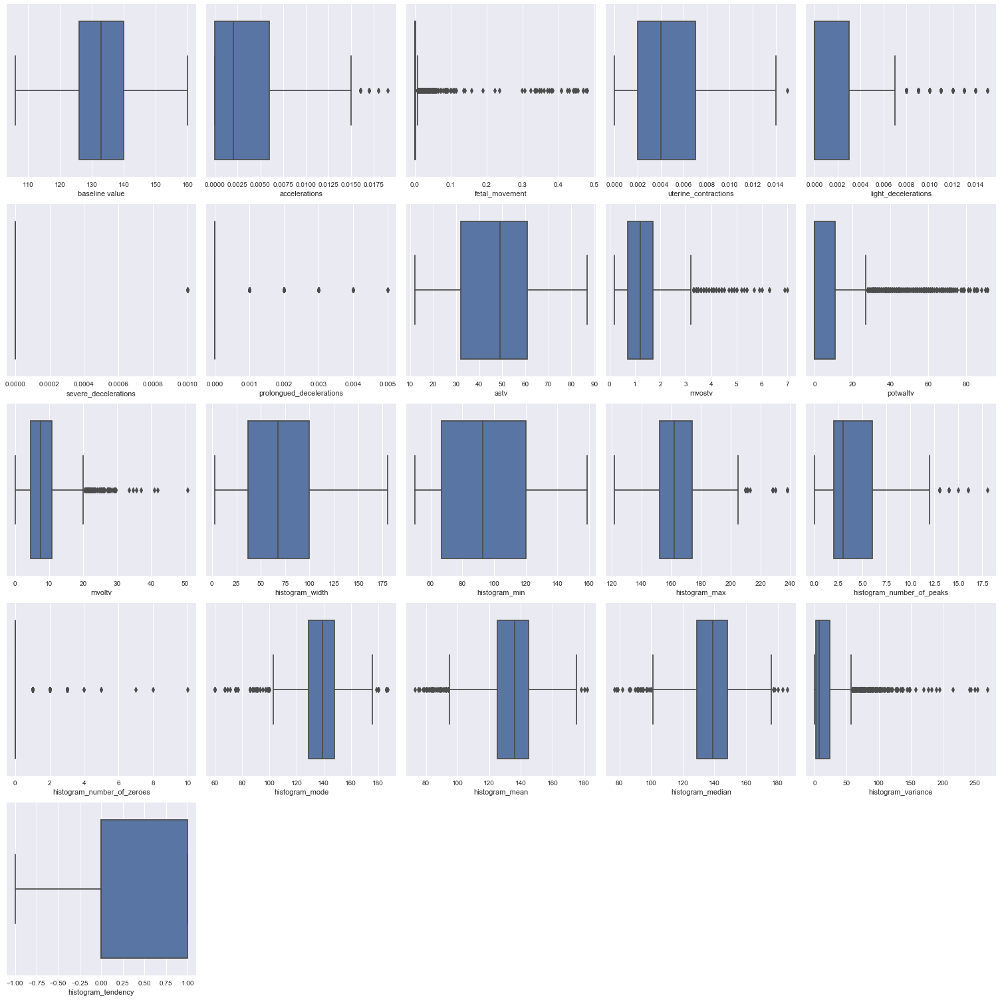

In [55]:
plt.figure(figsize=(21,21))
for i, col in enumerate(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'astv', 'mvostv', 'potwaltv', 'mvoltv',
       'histogram_width', 'histogram_min', 'histogram_max',
       'histogram_number_of_peaks', 'histogram_number_of_zeroes',
       'histogram_mode', 'histogram_mean', 'histogram_median',
       'histogram_variance', 'histogram_tendency']):
    plt.subplot(5,5,i+1)
    sns.axes_style()
#     sns.set_style("darkgrid", {"axes.facecolor": ".9"})
    sns.boxplot(data=df,x=col)    
    plt.tight_layout()
   

### Train Test Split

In [64]:
y = df['fetal_health']
X = df.drop('fetal_health', axis=1)

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25, random_state= 52)

In [138]:
def model(modelname, x_train, x_test, y_train, y_test, gridsearch=None, scaler=True, FeatImp=False):
    
    if scaler:
        scaler = StandardScaler()
        x_train = scaler.fit_transform(x_train)
        x_test = scaler.transform(x_test)
    
    if gridsearch:
        
        model = modelname()
        model = GridSearchCV(model, gridsearch, cv=3)
        trainPoint = time.time()
        model.fit(x_train, y_train)
        trainTime = time.time() - trainPoint
        testPoint = time.time()
        y_pred_test = model.predict(x_test)
        testTime = time.time() - testPoint
        y_pred_train = model.predict(x_train)
        
        print(f"Optimal Parameters: {model.best_params_}")
        print('------------------------------------------')
        
        print('Confusion Matrix of Train set:')
        plot_confusion_matrix(model, x_train, y_train,
                         cmap=plt.cm.Greens)
        plt.grid(False)
        plt.show();
        print('-------------------------------------------')
        
        print('Confusion Matrix of Test set:')
        plot_confusion_matrix(model, x_test, y_test,
                         cmap=plt.cm.Greens)
        plt.grid(False)
        plt.show();
        print('-------------------------------------------')
        
        print('Train Classification Report:')
        print(classification_report(y_train,y_pred_train))
        print('-------------------------------------------')
        
        print('Test Classification Report:')
        print(classification_report(y_test, y_pred_test))
        
        
        x_train = pd.DataFrame(x_train, columns=X.columns)
        n_features = x_train.shape[1]
        plt.figure(figsize=(8,8))
        plt.barh(range(n_features), model.best_estimator_.feature_importances_, align='center') 
        plt.yticks(np.arange(n_features), x_train.columns.values) 
        plt.xlabel('Feature importance')
        plt.ylabel('Feature')
        
        
    
    if not gridsearch:
        
        model = modelname()
        trainPoint = time.time()
        model.fit(x_train, y_train)
        trainTime = time.time() - trainPoint
        testPoint = time.time()
        y_pred_test = model.predict(x_test)
        testTime = time.time() - testPoint
        y_pred_train = model.predict(x_train)
        
        print('Confusion Matrix of Train set:')
        plot_confusion_matrix(model, x_train, y_train,
                         cmap=plt.cm.Greens)
        plt.grid(False)
        plt.show();
        print('-------------------------------------------')
        
        print('Confusion Matrix of Test set:')
        plot_confusion_matrix(model, x_test, y_test,
                         cmap=plt.cm.Greens)
        plt.grid(False)
        plt.show();
        print('-------------------------------------------')
        
        print('Train Classification Report:')
        print(classification_report(y_train, y_pred_train))
        print('-------------------------------------------')
        
        print('Test Classification Report:')
        print(classification_report(y_test, y_pred_test))
        
    if FeatImp:
        n_features = x_train.shape[1]
        plt.figure(figsize=(8,8))
        plt.barh(range(n_features), model.feature_importances_, align='center') 
        plt.yticks(np.arange(n_features), x_train.columns.values) 
        plt.xlabel('Feature importance')
        plt.ylabel('Feature')
    
    
    Metrics = {'Model': [modelname]}
    
    Metrics['Train_Precision'] = [precision_score(y_train, y_pred_train, average=None)]
    Metrics['Train_Recall'] = [recall_score(y_train, y_pred_train, average=None)]
    Metrics['Train_f1'] = [f1_score(y_train, y_pred_train, average=None)]
    Metrics['Train_Accuracy'] = [accuracy_score(y_train, y_pred_train)]
    Metrics['Train_Time'] = [trainTime]
    
    Metrics['Test_Precision'] = [precision_score(y_test, y_pred_test, average=None)]
    Metrics['Test_Recall'] = [recall_score(y_test, y_pred_test, average=None)]
    Metrics['Test_f1'] = [f1_score(y_test, y_pred_test, average=None)]
    Metrics['Test_Accuracy'] = [accuracy_score(y_test, y_pred_test)]
    Metrics['Test_Time'] = [testTime]
    
    Eval_df = pd.DataFrame.from_dict(Metrics)
    
    return Eval_df

In [67]:
List_Of_Models = [LogisticRegression,
                  KNeighborsClassifier,SVC,
                  GaussianNB,
                  DecisionTreeClassifier,
                  
                  RandomForestClassifier,
                  AdaBoostClassifier,
                  GradientBoostingClassifier,
                  XGBClassifier]

## Baseline Models

### LogisticRegression

Confusion Matrix of Train set:


/Users/Ali/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


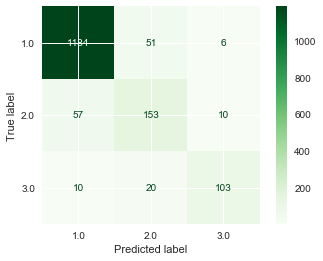

-------------------------------------------
Confusion Matrix of Test set:


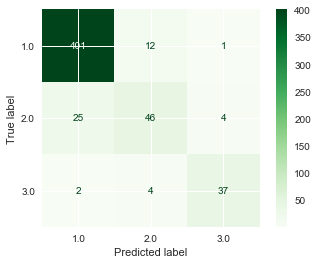

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.95      0.95      1241
         2.0       0.68      0.70      0.69       220
         3.0       0.87      0.77      0.82       133

    accuracy                           0.90      1594
   macro avg       0.83      0.81      0.82      1594
weighted avg       0.90      0.90      0.90      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.94      0.97      0.95       414
         2.0       0.74      0.61      0.67        75
         3.0       0.88      0.86      0.87        43

    accuracy                           0.91       532
   macro avg       0.85      0.81      0.83       532
weighted avg       0.90      0.91      0.91       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.linear_model._logistic.Logisti...,"[0.9464428457234213, 0.6830357142857143, 0.865...","[0.9540692989524577, 0.6954545454545454, 0.774...","[0.9502407704654896, 0.6891891891891891, 0.817...",0.903388,0.082393,"[0.9369158878504673, 0.7419354838709677, 0.880...","[0.9685990338164251, 0.6133333333333333, 0.860...","[0.9524940617577198, 0.6715328467153284, 0.870...",0.909774,0.000701


In [90]:
model(LogisticRegression, X_train, X_test, y_train, y_test, gridsearch=None, scaler=True)

### KNN

Confusion Matrix of Train set:


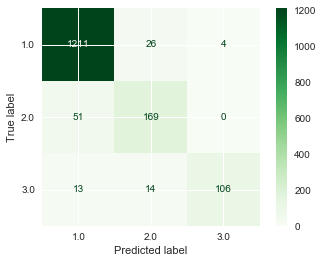

-------------------------------------------
Confusion Matrix of Test set:


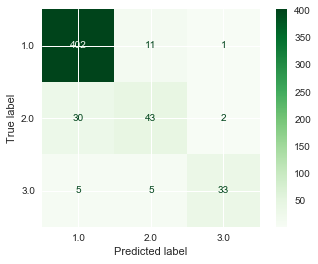

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.98      0.96      1241
         2.0       0.81      0.77      0.79       220
         3.0       0.96      0.80      0.87       133

    accuracy                           0.93      1594
   macro avg       0.91      0.85      0.87      1594
weighted avg       0.93      0.93      0.93      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.92      0.97      0.94       414
         2.0       0.73      0.57      0.64        75
         3.0       0.92      0.77      0.84        43

    accuracy                           0.90       532
   macro avg       0.86      0.77      0.81       532
weighted avg       0.89      0.90      0.89       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Time
0,<class 'sklearn.neighbors._classification.KNei...,"[0.9498039215686275, 0.8086124401913876, 0.963...","[0.975825946817083, 0.7681818181818182, 0.7969...","[0.9626391096979333, 0.7878787878787878, 0.872...",0.004048,"[0.919908466819222, 0.7288135593220338, 0.9166...","[0.9710144927536232, 0.5733333333333334, 0.767...","[0.9447708578143361, 0.6417910447761194, 0.835...",0.042443


In [74]:
model(KNeighborsClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=True)

### Naive Bayes

Confusion Matrix of Train set:


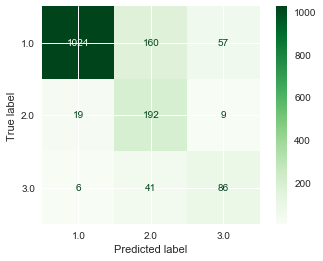

-------------------------------------------
Confusion Matrix of Test set:


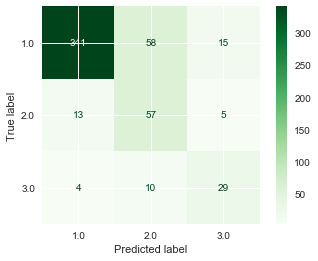

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.98      0.83      0.89      1241
         2.0       0.49      0.87      0.63       220
         3.0       0.57      0.65      0.60       133

    accuracy                           0.82      1594
   macro avg       0.68      0.78      0.71      1594
weighted avg       0.87      0.82      0.83      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.82      0.88       414
         2.0       0.46      0.76      0.57        75
         3.0       0.59      0.67      0.63        43

    accuracy                           0.80       532
   macro avg       0.67      0.75      0.69       532
weighted avg       0.85      0.80      0.82       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Time
0,<class 'sklearn.naive_bayes.GaussianNB'>,"[0.9761677788369876, 0.48854961832061067, 0.56...","[0.8251410153102336, 0.8727272727272727, 0.646...","[0.8943231441048035, 0.6264274061990212, 0.603...",0.004924,"[0.952513966480447, 0.456, 0.5918367346938775]","[0.8236714975845411, 0.76, 0.6744186046511628]","[0.8834196891191709, 0.5700000000000001, 0.630...",0.002619


In [75]:
model(GaussianNB, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False)

### Decision Tree Classifier

Confusion Matrix of Train set:


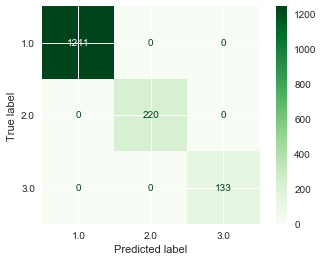

-------------------------------------------
Confusion Matrix of Test set:


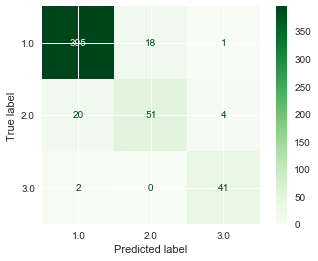

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       1.00      1.00      1.00       220
         3.0       1.00      1.00      1.00       133

    accuracy                           1.00      1594
   macro avg       1.00      1.00      1.00      1594
weighted avg       1.00      1.00      1.00      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.95      0.95       414
         2.0       0.74      0.68      0.71        75
         3.0       0.89      0.95      0.92        43

    accuracy                           0.92       532
   macro avg       0.86      0.86      0.86       532
weighted avg       0.91      0.92      0.91       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Time
0,<class 'sklearn.tree._classes.DecisionTreeClas...,"[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]",0.013944,"[0.947242206235012, 0.7391304347826086, 0.8913...","[0.9541062801932367, 0.68, 0.9534883720930233]","[0.9506618531889289, 0.7083333333333334, 0.921...",0.002133


In [76]:
model(DecisionTreeClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False)

### Random Forest Classifier

Confusion Matrix of Train set:


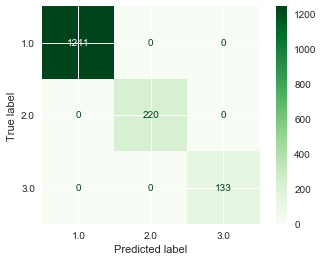

-------------------------------------------
Confusion Matrix of Test set:


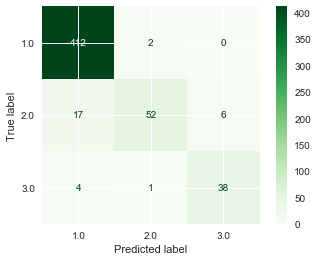

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       1.00      1.00      1.00       220
         3.0       1.00      1.00      1.00       133

    accuracy                           1.00      1594
   macro avg       1.00      1.00      1.00      1594
weighted avg       1.00      1.00      1.00      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      1.00      0.97       414
         2.0       0.95      0.69      0.80        75
         3.0       0.86      0.88      0.87        43

    accuracy                           0.94       532
   macro avg       0.92      0.86      0.88       532
weighted avg       0.94      0.94      0.94       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.ensemble._forest.RandomForestC...,"[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]",1.0,0.292158,"[0.9515011547344111, 0.9454545454545454, 0.863...","[0.9951690821256038, 0.6933333333333334, 0.883...","[0.9728453364817001, 0.8, 0.8735632183908046]",0.943609,0.016637


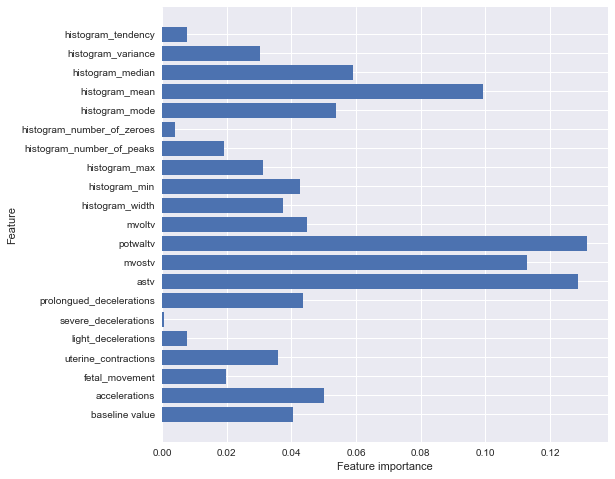

In [109]:
model(RandomForestClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False, FeatImp=True)

### AdaBoost 

Confusion Matrix of Train set:


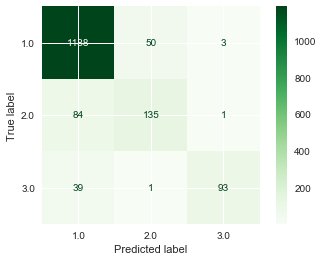

-------------------------------------------
Confusion Matrix of Test set:


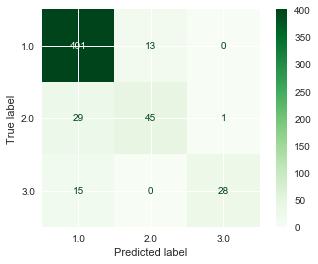

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.91      0.96      0.93      1241
         2.0       0.73      0.61      0.67       220
         3.0       0.96      0.70      0.81       133

    accuracy                           0.89      1594
   macro avg       0.86      0.76      0.80      1594
weighted avg       0.89      0.89      0.88      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.90      0.97      0.93       414
         2.0       0.78      0.60      0.68        75
         3.0       0.97      0.65      0.78        43

    accuracy                           0.89       532
   macro avg       0.88      0.74      0.80       532
weighted avg       0.89      0.89      0.88       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Time
0,<class 'sklearn.ensemble._weight_boosting.AdaB...,"[0.9061784897025171, 0.7258064516129032, 0.958...","[0.9572925060435133, 0.6136363636363636, 0.699...","[0.9310344827586207, 0.665024630541872, 0.8086...",0.158389,"[0.9011235955056179, 0.7758620689655172, 0.965...","[0.9685990338164251, 0.6, 0.6511627906976745]","[0.9336437718277066, 0.6766917293233082, 0.777...",0.014387


In [78]:
model(AdaBoostClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False)

### Gradient Boosting 

Confusion Matrix of Train set:


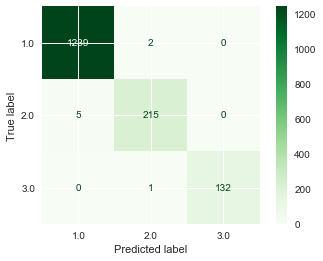

-------------------------------------------
Confusion Matrix of Test set:


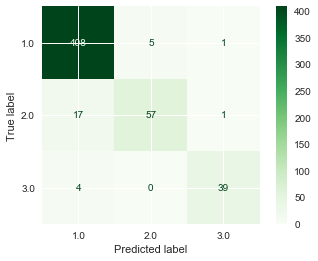

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       0.99      0.98      0.98       220
         3.0       1.00      0.99      1.00       133

    accuracy                           0.99      1594
   macro avg       0.99      0.99      0.99      1594
weighted avg       0.99      0.99      0.99      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.99      0.97       414
         2.0       0.92      0.76      0.83        75
         3.0       0.95      0.91      0.93        43

    accuracy                           0.95       532
   macro avg       0.94      0.88      0.91       532
weighted avg       0.95      0.95      0.95       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.ensemble._gb.GradientBoostingC...,"[0.9959807073954984, 0.9862385321100917, 1.0]","[0.9983883964544722, 0.9772727272727273, 0.992...","[0.9971830985915493, 0.9817351598173516, 0.996...",0.994981,1.114163,"[0.951048951048951, 0.9193548387096774, 0.9512...","[0.9855072463768116, 0.76, 0.9069767441860465]","[0.9679715302491103, 0.832116788321168, 0.9285...",0.947368,0.004454


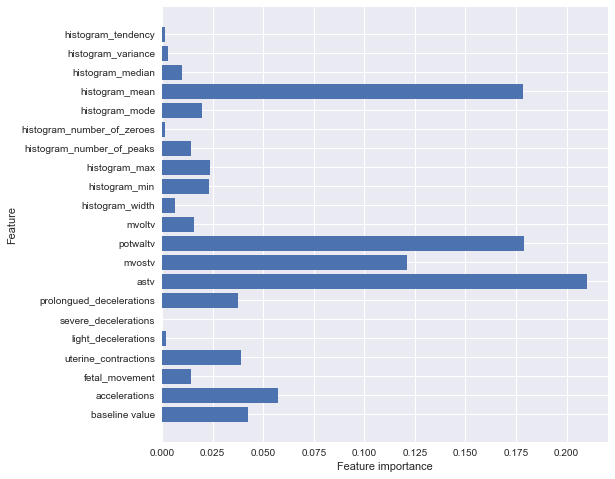

In [110]:
model(GradientBoostingClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False, FeatImp=True)

### XGBoost

Confusion Matrix of Train set:


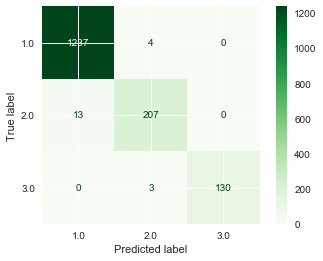

-------------------------------------------
Confusion Matrix of Test set:


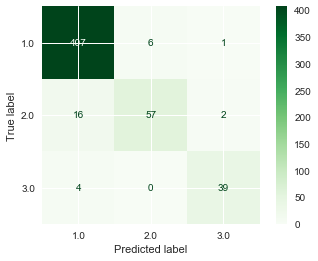

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.99      1.00      0.99      1241
         2.0       0.97      0.94      0.95       220
         3.0       1.00      0.98      0.99       133

    accuracy                           0.99      1594
   macro avg       0.99      0.97      0.98      1594
weighted avg       0.99      0.99      0.99      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.98      0.97       414
         2.0       0.90      0.76      0.83        75
         3.0       0.93      0.91      0.92        43

    accuracy                           0.95       532
   macro avg       0.93      0.88      0.90       532
weighted avg       0.94      0.95      0.94       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'xgboost.sklearn.XGBClassifier'>,"[0.9896, 0.9672897196261683, 1.0]","[0.9967767929089444, 0.9409090909090909, 0.977...","[0.993175431553593, 0.9539170506912443, 0.9885...",0.987453,0.567126,"[0.9531615925058547, 0.9047619047619048, 0.928...","[0.9830917874396136, 0.76, 0.9069767441860465]","[0.967895362663496, 0.8260869565217391, 0.9176...",0.945489,0.00537


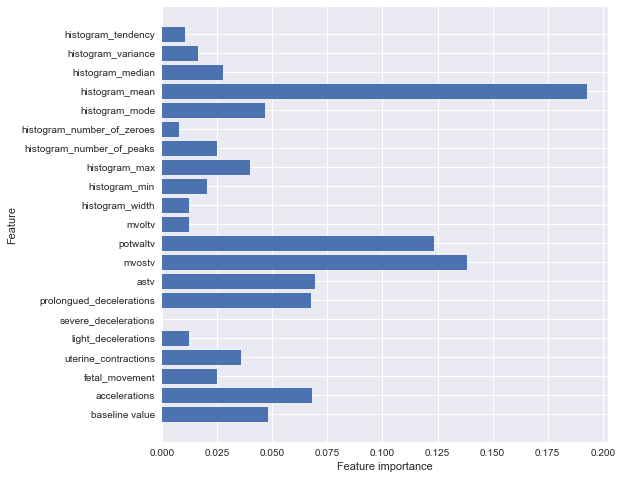

In [111]:
model(XGBClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=False,FeatImp=True)

### Support Vector Machines

Confusion Matrix of Train set:


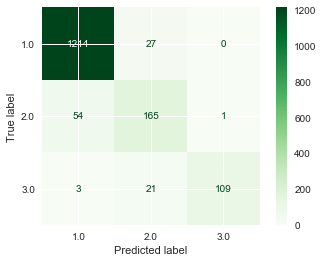

-------------------------------------------
Confusion Matrix of Test set:


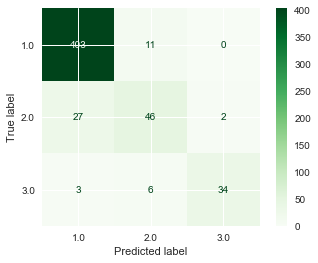

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97      1241
         2.0       0.77      0.75      0.76       220
         3.0       0.99      0.82      0.90       133

    accuracy                           0.93      1594
   macro avg       0.91      0.85      0.88      1594
weighted avg       0.93      0.93      0.93      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.93      0.97      0.95       414
         2.0       0.73      0.61      0.67        75
         3.0       0.94      0.79      0.86        43

    accuracy                           0.91       532
   macro avg       0.87      0.79      0.83       532
weighted avg       0.90      0.91      0.90       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Time
0,<class 'sklearn.svm._classes.SVC'>,"[0.955153422501967, 0.7746478873239436, 0.9909...","[0.9782433521353747, 0.75, 0.8195488721804511]","[0.9665605095541401, 0.7621247113163973, 0.897...",0.034584,"[0.930715935334873, 0.7301587301587301, 0.9444...","[0.9734299516908212, 0.6133333333333333, 0.790...","[0.9515938606847698, 0.6666666666666665, 0.860...",0.009506


In [81]:
model(SVC, X_train, X_test, y_train, y_test, gridsearch=None, scaler=True)

### Hist Gradient Boosting Classifier

Confusion Matrix of Train set:


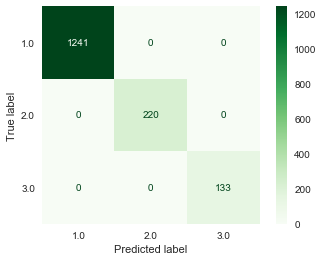

-------------------------------------------
Confusion Matrix of Test set:


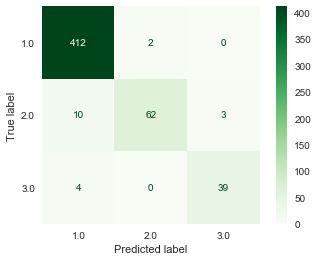

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       1.00      1.00      1.00       220
         3.0       1.00      1.00      1.00       133

    accuracy                           1.00      1594
   macro avg       1.00      1.00      1.00      1594
weighted avg       1.00      1.00      1.00      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.97      1.00      0.98       414
         2.0       0.97      0.83      0.89        75
         3.0       0.93      0.91      0.92        43

    accuracy                           0.96       532
   macro avg       0.95      0.91      0.93       532
weighted avg       0.96      0.96      0.96       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.ensemble._hist_gradient_boosti...,"[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]",1.0,2.575836,"[0.9671361502347418, 0.96875, 0.9285714285714286]","[0.9951690821256038, 0.8266666666666667, 0.906...","[0.9809523809523809, 0.8920863309352518, 0.917...",0.964286,0.009276


In [130]:
model(HistGradientBoostingClassifier, X_train, X_test, y_train, y_test, gridsearch=None, scaler=True)

## Best Models

* My best base model is Hist Gradient Boosting Classifier:

|Different Classes| Precision | Recall| F1_score| Accuracy|
| :-: | :-: | :-: | :-: | :-: | 
| 1  | .97  | 1.00  | .98  | .96  |
| 2  |  .97 | .83  | .89  | .96  |
| 3  |  .93 | .91  | .92  | .96  |

* My second best base model is  Gradient Boosting Classifier:

|Different Classes| Precision | Recall| F1_score| Accuracy|
| :-: | :-: | :-: | :-: | :-: | 
| 1  | .95  | .99  | .97  | .95  |
| 2  |  .92 | .77  | .84  | .95  |
| 3  |  .95 | .91  | .93  | .95  |

### GridSearch For Gradient Boosting

In [139]:
#Trying to do some gridsearch on gradient boosting classifier

param_grid = {
    'learning_rate': [0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.5, 0.7, 1],
    'n_estimators': [100, 150, 200],
    'min_samples_split': [2, 3],
    'max_features': [None, 'log2', 'sqrt'],    
}

Optimal Parameters: {'learning_rate': 0.1, 'max_depth': 4, 'max_features': 'sqrt', 'min_samples_split': 3, 'n_estimators': 200, 'subsample': 0.7}
------------------------------------------
Confusion Matrix of Train set:


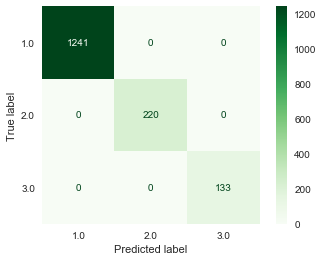

-------------------------------------------
Confusion Matrix of Test set:


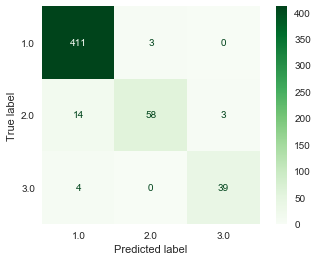

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       1.00      1.00      1.00       220
         3.0       1.00      1.00      1.00       133

    accuracy                           1.00      1594
   macro avg       1.00      1.00      1.00      1594
weighted avg       1.00      1.00      1.00      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.96      0.99      0.98       414
         2.0       0.95      0.77      0.85        75
         3.0       0.93      0.91      0.92        43

    accuracy                           0.95       532
   macro avg       0.95      0.89      0.92       532
weighted avg       0.95      0.95      0.95       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.ensemble._gb.GradientBoostingC...,"[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]",1.0,941.810941,"[0.958041958041958, 0.9508196721311475, 0.9285...","[0.9927536231884058, 0.7733333333333333, 0.906...","[0.9750889679715302, 0.8529411764705883, 0.917...",0.954887,0.00666


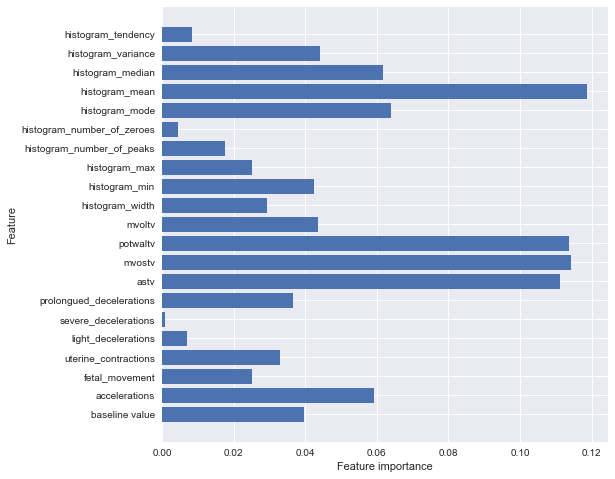

In [140]:
model(GradientBoostingClassifier, X_train, X_test, y_train, y_test, gridsearch=param_grid, scaler=True)

* As we can see, these are the feature importances in gradient boosting classifier, these features has the highest impact on our model. The top 4 are as follows:

 1. histogram_mean
 2. mean_value_of_short_term_variability
 3. percentage_of_time_with_abnormal_long_term_variability
 4. abnormal_short_term_variability


* with that, let's do some exploration in these features and study their density and how they spread in different classes of our target.

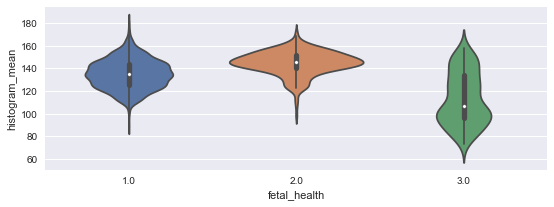

In [141]:
fig, ax =plt.subplots(figsize=(9,3))
sns.violinplot(data=df,y='histogram_mean',x='fetal_health',palette="deep");

feature histogram mean is the most important feature because as we can see data is more separable.

In feature histogram_mean:
  * majority of the suspected points are around 140 and greater that 140
  * majority of the normal points are around 140 and less than 140
  * and majority of the pathological points are around 100 and less than 100

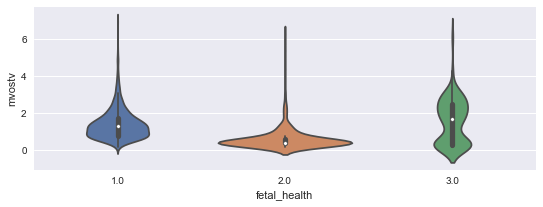

In [142]:
fig, ax =plt.subplots(figsize=(9,3))
sns.violinplot(data=df,y='mvostv',x='fetal_health',palette="deep");

In this case we can see the second most important feature mean_value_of_short_term_variability.
somehow same as histogram_mean

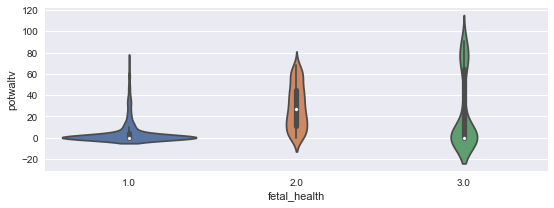

In [146]:
fig, ax =plt.subplots(figsize=(9,3))
sns.violinplot(data=df,y='potwaltv',x='fetal_health',palette="deep");

Percentage_of_time_with_abnormal_long_term_variability is also an interesting feature:
* majority of the normal points are around 0
* majority of the suspected points are between 0 and 80
* and majority of the pathological points are between -20 and 20 or between 70 and 110





Now let's study our least important features:
   * severe_decelerations ==> decelerations are fetal heart rate
   * light_decelerations

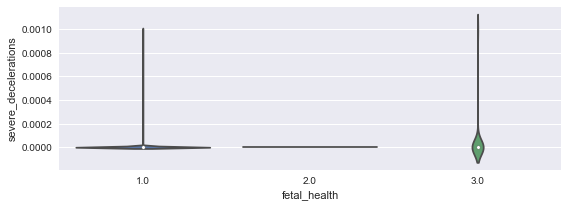

In [144]:
fig, ax =plt.subplots(figsize=(9,3))
sns.violinplot(data=df,y='severe_decelerations',x='fetal_health',palette="deep");

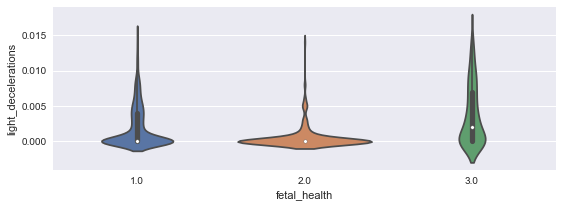

In [145]:
fig, ax =plt.subplots(figsize=(9,3))
sns.violinplot(data=df,y='light_decelerations',x='fetal_health',palette="deep");

In [153]:
#extract best parameters based on the last gridsearch
#create a function for gradient boosting classifier
# gridsearch does not support Feature_importances_
# without gridsearch we don't have crossvalidation, so results are slightly different


# def BestGradientBoosting(x_train, x_test, y_train, y_test, scaler=True, FeatImp=True):
    
#     if scaler:
#         scaler = StandardScaler()
#         x_train = scaler.fit_transform(x_train)
#         x_test = scaler.transform(x_test)
        
        
#     model = GradientBoostingClassifier(learning_rate=0.2, max_depth=3, max_features='log2',
#                                       min_samples_split =2, n_estimators=200)
#     scoring = ['precision_macro', 'recall_macro']
#     score = cross_validate(model, x_train, y_train, cv=3, scoring=scoring)
#     print(score)
#     trainPoint = time.time()
#     model.fit(x_train, y_train)
#     trainTime = time.time() - trainPoint
#     testPoint = time.time()
#     y_pred_test = model.predict(x_test)
#     testTime = time.time() - testPoint
#     y_pred_train = model.predict(x_train)
    
#     print('Confusion Matrix of Train set:')
#     plot_confusion_matrix(model, x_train, y_train,
#                      cmap=plt.cm.Greens)
#     plt.grid(False)
#     plt.show();
#     print('-------------------------------------------')
    
#     print('Confusion Matrix of Test set:')
#     plot_confusion_matrix(model, x_test, y_test,
#                      cmap=plt.cm.Greens)
#     plt.grid(False)
#     plt.show();
#     print('-------------------------------------------')
    
#     print('Train Classification Report:')
#     print(classification_report(y_train, y_pred_train))
#     print('-------------------------------------------')
    
#     print('Test Classification Report:')
#     print(classification_report(y_test, y_pred_test))
        
#     if FeatImp:
#         x_train = pd.DataFrame(x_train, columns=X.columns)
#         n_features = x_train.shape[1]
#         plt.figure(figsize=(8,8))
#         plt.barh(range(n_features), model.feature_importances_, align='center') 
#         plt.yticks(np.arange(n_features), x_train.columns.values) 
#         plt.xlabel('Feature importance')
#         plt.ylabel('Feature')
    
#     return

        
        

# BestGradientBoosting(X_train, X_test, y_train, y_test, scaler=True, FeatImp=True)

### GridSearch for Hist Gradient Boosting

In [131]:
#Trying to do some gridsearch on hist gradient boosting classifier

param_grid = {
    'learning_rate': [0.1, 0.2],
    'max_depth': [3, 4, 5, None],
    'max_iter': [100, 120],
    'min_samples_leaf': [20, 22],   
}

Optimal Parameters: {'learning_rate': 0.2, 'max_depth': None, 'max_iter': 100, 'min_samples_leaf': 22}
------------------------------------------
Confusion Matrix of Train set:


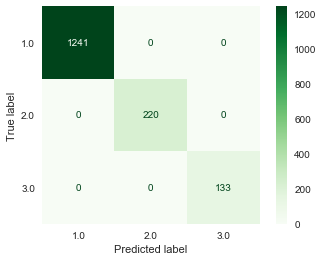

-------------------------------------------
Confusion Matrix of Test set:


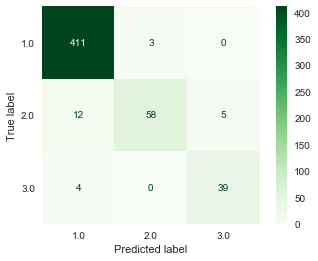

-------------------------------------------
Train Classification Report:
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1241
         2.0       1.00      1.00      1.00       220
         3.0       1.00      1.00      1.00       133

    accuracy                           1.00      1594
   macro avg       1.00      1.00      1.00      1594
weighted avg       1.00      1.00      1.00      1594

-------------------------------------------
Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.96      0.99      0.98       414
         2.0       0.95      0.77      0.85        75
         3.0       0.89      0.91      0.90        43

    accuracy                           0.95       532
   macro avg       0.93      0.89      0.91       532
weighted avg       0.95      0.95      0.95       532



,Model,Train_Precision,Train_Recall,Train_f1,Train_Accuracy,Train_Time,Test_Precision,Test_Recall,Test_f1,Test_Accuracy,Test_Time
0,<class 'sklearn.ensemble._hist_gradient_boosti...,"[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]","[1.0, 1.0, 1.0]",1.0,108.85428,"[0.9625292740046838, 0.9508196721311475, 0.886...","[0.9927536231884058, 0.7733333333333333, 0.906...","[0.9774078478002377, 0.8529411764705883, 0.896...",0.954887,0.008323


In [132]:
model(HistGradientBoostingClassifier, X_train, X_test, y_train, y_test, gridsearch=param_grid, scaler=True)

## Predictor Function

* Creating a function for unseen data and also get inputs for some new data might be beneficial

In [163]:
def predict(array):
    clf = HistGradientBoostingClassifier()
    clf.fit(X_train, y_train)
    prediction = clf.predict([array])
    print(prediction)
    return
    

In [179]:
array = [135,.002,0.015,0, 0, 0, 0, 54, 1, 10, 16.7, 132, 66, 198, 10, 0, 150, 143, 146, 12, 0]
predict(array)

[2.]


In [176]:
# this is a function that takes input for each feature 

def predict_with_input(unseendata, input_feature =True):
    
    if unseendata:
        clf = HistGradientBoostingClassifier()
        clf.fit(X_train, y_train)
        prediction = clf.predict([array])
        print(prediction)
        
    if input_feature:
        clf = HistGradientBoostingClassifier()
        clf.fit(X_train, y_train)
        
        record = []
        for col in X_test.columns:
            minimum = df[col].min()
            maximum = df[col].max()
            x = input('Enter a number between {} and {} for {}'.format(minimum, maximum, col))
            record.append(x)
        prediction = clf.predict([record])
        classes = {1.: 'Normal', 2.: 'Suspect', 3.: 'Pathological'}
        print('Fetal Classified as:', classes[prediction[0]])
        
    return

In [178]:
predict_with_input(unseendata=[], input_feature =True)

Enter a number between 106.0 and 160.0 for baseline value159
Enter a number between 0.0 and 0.019 for accelerations.01
Enter a number between 0.0 and 0.48100000000000004 for fetal_movement.4
Enter a number between 0.0 and 0.015 for uterine_contractions0
Enter a number between 0.0 and 0.015 for light_decelerations.01
Enter a number between 0.0 and 0.001 for severe_decelerations0
Enter a number between 0.0 and 0.005 for prolongued_decelerations0
Enter a number between 12.0 and 87.0 for astv80
Enter a number between 0.2 and 7.0 for mvostv7
Enter a number between 0.0 and 91.0 for potwaltv90
Enter a number between 0.0 and 50.7 for mvoltv50
Enter a number between 3.0 and 180.0 for histogram_width170
Enter a number between 50.0 and 159.0 for histogram_min140
Enter a number between 122.0 and 238.0 for histogram_max230
Enter a number between 0.0 and 18.0 for histogram_number_of_peaks17
Enter a number between 0.0 and 10.0 for histogram_number_of_zeroes9
Enter a number between 60.0 and 187.0 for 

## Misclassified Data

In [206]:
clf = HistGradientBoostingClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
prediction = pd.Series(prediction,name='y_pred')

In [207]:
prediction


0      1.0
1      1.0
2      2.0
3      1.0
4      1.0
      ... 
527    1.0
528    1.0
529    1.0
530    1.0
531    1.0
Name: y_pred, Length: 532, dtype: float64

In [212]:
y_test_misclass = pd.Series(y_test, name='y_test')
y_test_misclass

1187    1.0
1314    1.0
316     2.0
1278    1.0
810     2.0
       ... 
2020    1.0
1338    1.0
1994    1.0
1590    1.0
1452    1.0
Name: y_test, Length: 532, dtype: float64

In [222]:
df_list = [X_test, y_test_misclass]
Misclass_df = pd.concat(df_list, axis=1)
Misclass_df

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,astv,mvostv,potwaltv,mvoltv,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,y_test
1187,120.0,0.000,0.000,0.007,0.000,0.0,0.000,49.0,0.8,2.0,10.5,32.0,104.0,136.0,4.0,0.0,116.0,120.0,121.0,4.0,0.0,1.0
1314,125.0,0.008,0.007,0.007,0.005,0.0,0.000,23.0,2.1,0.0,5.5,125.0,53.0,178.0,8.0,0.0,143.0,128.0,137.0,65.0,1.0,1.0
316,150.0,0.000,0.022,0.000,0.000,0.0,0.000,74.0,0.3,56.0,6.4,25.0,131.0,156.0,4.0,0.0,150.0,150.0,151.0,0.0,1.0,2.0
1278,115.0,0.007,0.000,0.006,0.000,0.0,0.001,17.0,2.0,0.0,13.9,73.0,84.0,157.0,0.0,1.0,120.0,117.0,119.0,13.0,0.0,1.0
810,146.0,0.000,0.000,0.002,0.001,0.0,0.000,53.0,0.7,44.0,8.1,70.0,93.0,163.0,4.0,1.0,157.0,152.0,156.0,8.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,125.0,0.000,0.000,0.007,0.008,0.0,0.000,64.0,1.4,0.0,2.4,90.0,65.0,155.0,6.0,0.0,111.0,111.0,114.0,8.0,0.0,1.0
1338,128.0,0.000,0.016,0.010,0.008,0.0,0.002,16.0,2.9,0.0,7.8,125.0,53.0,178.0,9.0,0.0,133.0,114.0,121.0,74.0,0.0,1.0
1994,125.0,0.000,0.000,0.007,0.008,0.0,0.000,62.0,1.7,0.0,1.2,73.0,68.0,141.0,9.0,0.0,128.0,117.0,126.0,29.0,1.0,1.0
1590,134.0,0.000,0.000,0.004,0.007,0.0,0.000,37.0,1.1,22.0,2.9,93.0,50.0,143.0,5.0,0.0,138.0,129.0,136.0,31.0,1.0,1.0


In [223]:
Misclass_df.index

Int64Index([1187, 1314,  316, 1278,  810,   51,  885,  310, 1524,  780,
            ...
             741,  783,  358, 1292, 1775, 2020, 1338, 1994, 1590, 1452],
           dtype='int64', length=532)

In [224]:
Misclass_df.reset_index(inplace=True)

In [225]:
Misclass_df

,index,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,astv,mvostv,potwaltv,mvoltv,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,y_test
0,1187,120.0,0.000,0.000,0.007,0.000,0.0,0.000,49.0,0.8,2.0,10.5,32.0,104.0,136.0,4.0,0.0,116.0,120.0,121.0,4.0,0.0,1.0
1,1314,125.0,0.008,0.007,0.007,0.005,0.0,0.000,23.0,2.1,0.0,5.5,125.0,53.0,178.0,8.0,0.0,143.0,128.0,137.0,65.0,1.0,1.0
2,316,150.0,0.000,0.022,0.000,0.000,0.0,0.000,74.0,0.3,56.0,6.4,25.0,131.0,156.0,4.0,0.0,150.0,150.0,151.0,0.0,1.0,2.0
3,1278,115.0,0.007,0.000,0.006,0.000,0.0,0.001,17.0,2.0,0.0,13.9,73.0,84.0,157.0,0.0,1.0,120.0,117.0,119.0,13.0,0.0,1.0
4,810,146.0,0.000,0.000,0.002,0.001,0.0,0.000,53.0,0.7,44.0,8.1,70.0,93.0,163.0,4.0,1.0,157.0,152.0,156.0,8.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,2020,125.0,0.000,0.000,0.007,0.008,0.0,0.000,64.0,1.4,0.0,2.4,90.0,65.0,155.0,6.0,0.0,111.0,111.0,114.0,8.0,0.0,1.0
528,1338,128.0,0.000,0.016,0.010,0.008,0.0,0.002,16.0,2.9,0.0,7.8,125.0,53.0,178.0,9.0,0.0,133.0,114.0,121.0,74.0,0.0,1.0
529,1994,125.0,0.000,0.000,0.007,0.008,0.0,0.000,62.0,1.7,0.0,1.2,73.0,68.0,141.0,9.0,0.0,128.0,117.0,126.0,29.0,1.0,1.0
530,1590,134.0,0.000,0.000,0.004,0.007,0.0,0.000,37.0,1.1,22.0,2.9,93.0,50.0,143.0,5.0,0.0,138.0,129.0,136.0,31.0,1.0,1.0


In [226]:
Misclass_df = pd.concat([Misclass_df, prediction], axis=1)
Misclass_df.drop('index', axis=1, inplace=True)
Misclass_df

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,astv,mvostv,potwaltv,mvoltv,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,y_test,y_pred
0,120.0,0.000,0.000,0.007,0.000,0.0,0.000,49.0,0.8,2.0,10.5,32.0,104.0,136.0,4.0,0.0,116.0,120.0,121.0,4.0,0.0,1.0,1.0
1,125.0,0.008,0.007,0.007,0.005,0.0,0.000,23.0,2.1,0.0,5.5,125.0,53.0,178.0,8.0,0.0,143.0,128.0,137.0,65.0,1.0,1.0,1.0
2,150.0,0.000,0.022,0.000,0.000,0.0,0.000,74.0,0.3,56.0,6.4,25.0,131.0,156.0,4.0,0.0,150.0,150.0,151.0,0.0,1.0,2.0,2.0
3,115.0,0.007,0.000,0.006,0.000,0.0,0.001,17.0,2.0,0.0,13.9,73.0,84.0,157.0,0.0,1.0,120.0,117.0,119.0,13.0,0.0,1.0,1.0
4,146.0,0.000,0.000,0.002,0.001,0.0,0.000,53.0,0.7,44.0,8.1,70.0,93.0,163.0,4.0,1.0,157.0,152.0,156.0,8.0,1.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,125.0,0.000,0.000,0.007,0.008,0.0,0.000,64.0,1.4,0.0,2.4,90.0,65.0,155.0,6.0,0.0,111.0,111.0,114.0,8.0,0.0,1.0,1.0
528,128.0,0.000,0.016,0.010,0.008,0.0,0.002,16.0,2.9,0.0,7.8,125.0,53.0,178.0,9.0,0.0,133.0,114.0,121.0,74.0,0.0,1.0,1.0
529,125.0,0.000,0.000,0.007,0.008,0.0,0.000,62.0,1.7,0.0,1.2,73.0,68.0,141.0,9.0,0.0,128.0,117.0,126.0,29.0,1.0,1.0,1.0
530,134.0,0.000,0.000,0.004,0.007,0.0,0.000,37.0,1.1,22.0,2.9,93.0,50.0,143.0,5.0,0.0,138.0,129.0,136.0,31.0,1.0,1.0,1.0


In [233]:
Final_Misclass_df = Misclass_df[Misclass_df['y_test'] != Misclass_df['y_pred']]
Final_Misclass_df

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,astv,mvostv,potwaltv,mvoltv,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,y_test,y_pred
4,146.0,0.000,0.000,0.002,0.001,0.0,0.000,53.0,0.7,44.0,8.1,70.0,93.0,163.0,4.0,1.0,157.0,152.0,156.0,8.0,1.0,2.0,1.0
13,140.0,0.000,0.008,0.006,0.002,0.0,0.003,62.0,2.4,2.0,0.3,56.0,85.0,141.0,3.0,0.0,131.0,123.0,130.0,11.0,1.0,3.0,1.0
45,131.0,0.000,0.003,0.003,0.008,0.0,0.003,67.0,1.7,0.0,0.0,68.0,78.0,146.0,7.0,0.0,121.0,116.0,120.0,15.0,0.0,3.0,1.0
67,128.0,0.000,0.000,0.006,0.014,0.0,0.003,23.0,6.3,0.0,0.0,144.0,52.0,196.0,10.0,2.0,90.0,98.0,91.0,95.0,-1.0,2.0,3.0
166,148.0,0.000,0.004,0.005,0.000,0.0,0.000,78.0,0.5,4.0,10.0,32.0,140.0,172.0,1.0,0.0,150.0,150.0,151.0,1.0,-1.0,2.0,3.0
217,139.0,0.001,0.011,0.000,0.000,0.0,0.000,54.0,0.9,3.0,9.4,121.0,55.0,176.0,6.0,1.0,154.0,147.0,148.0,9.0,1.0,2.0,1.0
246,146.0,0.000,0.000,0.001,0.000,0.0,0.000,53.0,0.5,32.0,8.2,27.0,136.0,163.0,2.0,1.0,160.0,156.0,158.0,2.0,1.0,2.0,1.0
285,139.0,0.002,0.003,0.000,0.003,0.0,0.000,51.0,2.2,0.0,7.1,148.0,52.0,200.0,12.0,4.0,147.0,137.0,145.0,55.0,0.0,2.0,1.0
288,121.0,0.000,0.000,0.003,0.005,0.0,0.002,24.0,1.5,0.0,0.0,68.0,71.0,139.0,2.0,0.0,123.0,106.0,108.0,53.0,0.0,2.0,1.0
293,156.0,0.000,0.000,0.011,0.008,0.0,0.001,34.0,5.4,0.0,3.3,150.0,50.0,200.0,8.0,0.0,117.0,131.0,136.0,108.0,0.0,2.0,1.0


In [234]:
Final_Misclass_df.y_test.value_counts(normalize=True)

2.0    0.684211
3.0    0.210526
1.0    0.105263
Name: y_test, dtype: float64